# Data Science lab Martian terrain segmentation
### Problem statement
An image segmentation needs to be performed using the mask labels provided in the shape files.   
  
    
    

# Imports


In [2]:
from osgeo import gdal #Geospatial data abstraction library
import os #Used for running gdal commands in python
import matplotlib.pyplot as plt #Used for plotting data
import numpy as np
import mpld3 #For making zoomable pyplots
import pandas as pd



# Useful GDAL commands 

1. To get info about .tif file  
gdalinfo dem.tif   
Options are -stats  

Running this command on our .tif file shows us that only 75% of our pixels are valid and the missing values are filled with  0. Also it looks like our image has only one band, probably meaning it is in greyscale. Its resolution is 358x632 and the mean value of each pixel is 194.251

In [2]:
#Name of the .tif file
# dem_file  = "highres_tif.tif"

# #Generating a slope file
# generate_slope_cmd = "gdaldem slope Hillshade.tif slope2.tif "
# os.system(generate_slope_cmd)


## Opening the data

In [30]:
#Opening the slope file
data = gdal.Open("Hillshade.tif")

# Read the slope file as a numpy array
data_array = data.GetRasterBand(1).ReadAsArray().astype(float)

#Store value which represents NoData, here it is 0
no_data_value = data.GetRasterBand(1).GetNoDataValue()

#Replace NoData with np.nan
# if np.any(data_array == no_data_value):
#     data_array[data_array == no_data_value] = np.nan

# Visualizing the dataset

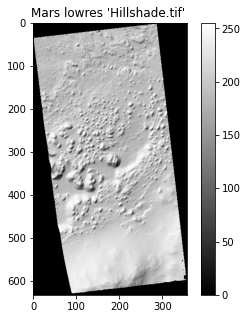

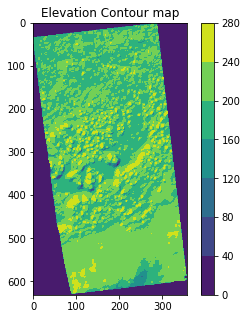

In [3]:
#For zoomable images
%matplotlib inline
mpld3.enable_notebook()
mpld3.disable_notebook()

#Plot image in grayscale
plt.figure(figsize=(5,5))
plt.imshow(data_array, cmap = 'gray')
plt.colorbar()
plt.title("Mars lowres 'Hillshade.tif' ")
plt.show()


#Plot a contour graph
plt.figure(figsize=(5,5))
plt.title("Elevation Contour map")
plt.contourf(data_array)
plt.colorbar()
plt.gca().set_aspect('equal')
plt.gca().invert_yaxis()
plt.show()


# Trying to visualize the dataset in 3D

In [13]:
xyz_file = '3d.xyz'
xyz_data = pd.read_csv(xyz_file, header=None, sep = ' ')
xyz_data.head()
x = xyz_data[0]
y = xyz_data[1]
z = xyz_data[2]

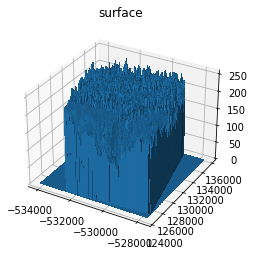

In [20]:
from mpl_toolkits.mplot3d.axes3d import *
import matplotlib.pyplot as plt
from matplotlib import cm
# fig = plt.figure()
# ax = Axes3D(fig)
# ax.scatter3D(x,y,z,c=z,cmap=plt.cm.jet)  

# plt.show()


ax = plt.axes(projection='3d')
# ax.plot_surface(x,y,z, rstride=1, cstride=1,
#                 cmap='viridis', edgecolor='none')
ax.plot_trisurf(x,y,z, linewidth=0, antialiased=False)
ax.set_title('surface');

In [168]:
import plotly.graph_objects as go

import pandas as pd

# Read data from a csv

fig = go.Figure(data=[go.Surface(x=x,y=y,z=z)])



fig.show()

# Plotting the tpi_classification path

[]

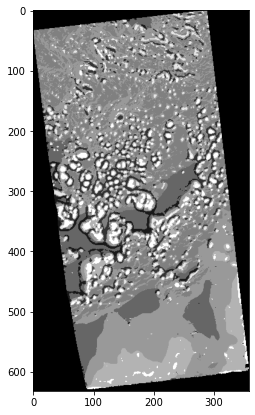

In [5]:
tpi_classification_path = 'tpi_based_classification/TPI_landform_5_integer.tif'
tpi_array = gdal.Open(tpi_classification_path).ReadAsArray()

plt.figure(figsize=(7,7))
plt.imshow(tpi_array, cmap='gray')
plt.plot()

# Plotting the low_res_dem file

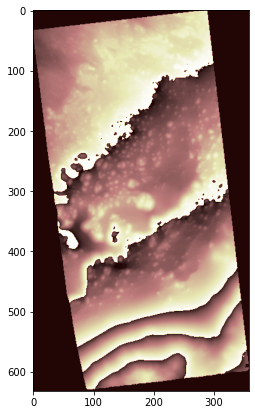

In [66]:
lowres_dem_path = 'DEM\Low-res_DEM\Firsoff_HiRISE_5_low_res.tif-adj.tif'
tpi_classification_path = 'tpi_based_classification/TPI_landform_5_integer.tif'

# dem = gdal.Open(lowres_dem_path).GetRasterBand(1).ReadAsArray()

from matplotlib import pyplot
import matplotlib
import rasterio

ds = gdal.Open(lowres_dem_path, gdal.GA_ReadOnly)
rb = ds.GetRasterBand(1)
img_array = rb.ReadAsArray().astype(np.uint8)
# img_array = np.negative(img_array)
plt.figure(figsize=(7,7))
plt.imshow(img_array, cmap='pink')

# This function normalizes all values from our dataset (min:-3049,max:-1595) to 0-255 range so that we can plot it.
# image_DN = np.interp(img_array, (-3049.952, -1595.762), (1595, 5049)).astype(np.uint8)
# plt.figure(figsize=(7,7))
# plt.imshow(image_DN)






# Trying to plot shapefiles

KeyError: 0

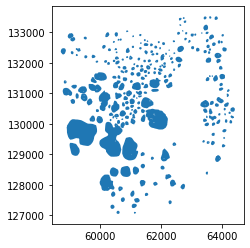

In [78]:
import geopandas
df=geopandas.read_file('mapping\polygons\mounds.shp')
df.plot()
df

# plt.figure()
# plt.plot(df)